<div class="alert alert-info"> 
Привет, Александр!
Рада знакомству. Буду рада научиться чему-то новому)</div>

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №2__

Мария, рад тебя видеть =)

# Проектная работа
# Рынок заведений общественного питания Москвы

**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных**

Файл ***moscow_places.csv***:

***name*** — название заведения;

***address*** — адрес заведения;

***category*** — категория заведения, например «кафе», «пиццерия» или «кофейня»;

***hours*** — информация о днях и часах работы;

***lat*** — широта географической точки, в которой находится заведение;

***lng***— долгота географической точки, в которой находится заведение;

***rating*** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

***price*** — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

***avg_bill*** — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

***middle_avg_bill*** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

***middle_coffee_cup*** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

***chain*** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

***district*** — административный район, в котором находится заведение, например Центральный административный округ;

***seats*** — количество посадочных мест.

**План проекта:**
- Загрузить данные и изучите общую информацию
- Выполнить предобработку данных (выявить и обработать пропуски данных, при необходимости изменить типы данных, найти и обработать дубликаты (при их обнаружении)
- Провести анализ данных:
   - исследовать количество объектов общественного питания по категориям,
   - исследовать количество посадочных мест в местах по категориям,
   - рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете,
   - исследовать топ-15 популярных сетей в Москве,
   - отобразить общее количество заведений и количество заведений каждой категории по районам,
   - визуализируйте распределение средних рейтингов по категориям заведений,
   - построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района,отобразить все заведения датасета на карте с помощью кластеров,
   - изучить топ-15 улиц по количеству заведений,
   - построить фоновую картограмму (хороплет) с медианными значениями средних чеков заведений.
- Провести детальное исследование, предшествующее открытию новой кофейни:
   - особенности их расположения кофеен по районам,
   - есть ли круглосуточные кофейни,
   - распределение рейтингов по районам,
   - медианная стоимость чашки кофе по районам.
- Сформулировать выводы.   
- Подготовить презентацию для инвесторов.   
   

## Загрузка данных и изучение общей информации

In [1]:
#импортируем нужные библиотеки
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
#сохраним данные в переменной data и выведем первые 10 строк датафрейма
data = pd.read_csv('/datasets/moscow_places.csv')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
#выведем общую информацию о датафрейме
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.shape

(8406, 14)

В исследуемом датафрейме 14 столбцов и 8406 строк.
Входе предобработки данных необходимо:
- заменить тип данных в столбце chain на bool
- найти и по возможности обработать пропуски(обращает на себя вниание большое их количество в некоторых столбцах)
- проверить датасет на наличие дубликатов.


## Предобработка данных

### Заменим тип данных в столбце chain на bool 

 Это необходимо для дальнейшего аналииза данных

In [5]:
data['chain'] = data['chain'].astype(bool)

Остальные типы данных оставим без изменений

### Найдем и обработаем пропуски данных

In [6]:
#суммарно
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
#в процентном отношении
data.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

Обращает на себя внимание 93,6% пропусков в столбце со средней стоимостью чшки кофе. Значение в этом столбце актуально только для кофеен. Посмотрим, как обстоят дела в этой категории заведений.

In [8]:
data[data['category'] == 'кофейня']['middle_coffee_cup'].isna().mean()

0.6312809624911536

Пропусков стало меньше, но все равно цифра значительная. При замене пропусков на определенные зачания исказится результат дальнейшего анализа. Оставим их без изменения.

Пропуски в столбце 'hours' заменим 'Unknown', возможно,в будущем компании добавят информацию о режиме работы

In [9]:

data['hours'] = data['hours'].fillna('Unknown')

Учитывая тот факт, что в остальных столбцах количество пропусков превышает 54%, оставим их без изменений, чтобы не исказить результат анализа данных.

### Проверим датафрейм на наличие дубликатов

In [10]:
data.duplicated().sum()

0

Явных дубликатов строк не выявлено.

В датафрейме присутствуют дубликаты названий заведений, т.к. часть их являются сетевыми, также могут дублироваться адреса (несколько заведений могут располагаться в одном здании). Проверим наличие дубликатов одновременно в столбце с названием и адресом заведения.

Приведем названия заведений и адрес к единой форме (нижний регистр), создадим дополнительные столбцы в датафрейме

In [11]:
data['name_lower'] = data['name'].str.lower()
data['address_lower'] = data['address'].str.lower()
data.duplicated(subset=['name_lower','address_lower']).sum()


4

Найдены 4 неявных дубликата.Посмотрим на них.

In [12]:
duplicates = data[data.duplicated(subset=['name_lower', 'address_lower'], keep=False)]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,name_lower,address_lower
189,Кафе,кафе,"Москва, парк Ангарские Пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,False,NaN,кафе,"москва, парк ангарские пруды"
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,False,NaN,кафе,"москва, парк ангарские пруды"
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188.0,more poke,"москва, волоколамское шоссе, 11, стр. 2"
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188.0,more poke,"москва, волоколамское шоссе, 11, стр. 2"
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,False,150.0,раковарня клешни и хвосты,"москва, проспект мира, 118"
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,True,150.0,раковарня клешни и хвосты,"москва, проспект мира, 118"
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,True,276.0,хлеб да выпечка,"москва, ярцевская улица, 19"
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,Unknown,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,False,276.0,хлеб да выпечка,"москва, ярцевская улица, 19"


Удалим дублирующие строки датафрейма

In [13]:
data = data.drop_duplicates(subset=['name_lower', 'address_lower'], keep='first')


Удалим созданные для проверки дополнительные столбцы датафрейма, больше они нам не пригодятся.

In [14]:
data = data.drop(columns = ['name_lower','address_lower'])
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0


### Создадим столбец 'street' с названиями улиц из столбца с адресом  и столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [15]:
data['street'] = data['address'].str.extract(r',\s*([^,]+)(?:\s*,|$)')
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(10)



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,False,NaN,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,False,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,False,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,False,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,False,65.0,Ангарская улица,False


In [16]:
#проверим, не появились ли пропуски в результате 
data['street'].isna().sum()

0

***Выводы:***
- Данные предобработаны, добавлен столбец с названием улицы и столбец с булевым значением для обозначения круглосуточных заведений
- Произведены замены типа данных там, где это необходимо
- Найдены пропуски, произведено их заполнение по возможности
- Явные дубликаты отсутствуют, неявные дубликаты найдены и удалены.

## Анализ данных

### Исследуем количество объектов общественного питания по категориям

In [17]:
data_cat = data.groupby('category')['name'].count().sort_values(ascending=False)
data_cat

category
кафе               2376
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: name, dtype: int64

Для наглядности визуализируем полученные данные.

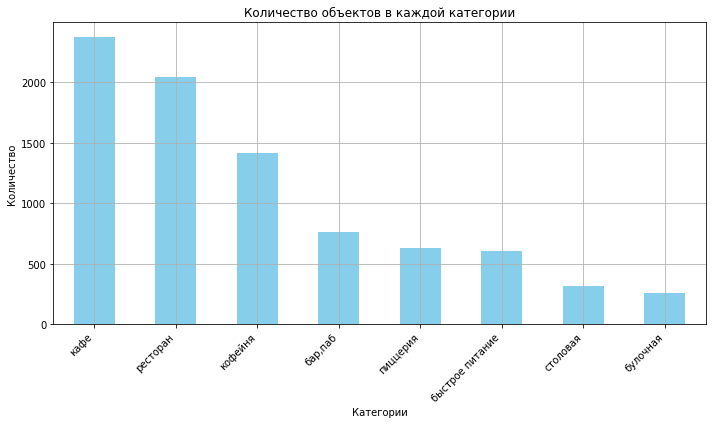

In [18]:
# Создание столбчатой диаграммы

plt.figure(figsize=(10, 6))  # Размер графика
data_cat.plot(kind='bar', color='skyblue')  # Горизонтальная столбчатая диаграмма
plt.title('Количество объектов в каждой категории')
plt.xlabel('Категории')
plt.ylabel('Количество')
plt.xticks(rotation=45, ha='right')  # Поворот подписей оси X
plt.tight_layout()  # Улучшенное размещение графика
plt.grid()
plt.show()

In [19]:
# Построение круговой диаграммы
data_cat = data.groupby('category')['name'].count().sort_values(ascending=False).reset_index()

fig = px.pie(data_cat, 
             values='name',  # Значения для круговой диаграммы
             names='category',  # Метки категорий
             title='Распределение заведений по категориям')

# Добавляем подписи с долями (проценты)
fig.update_traces(textinfo='percent+label',  # Показывать проценты и названия категорий
                  textposition='inside',  # Подписи внутри диаграммы
                  hoverinfo='label+percent+value')  # Информация при наведении: метка, процент и значение

# Отображение диаграммы
fig.show()

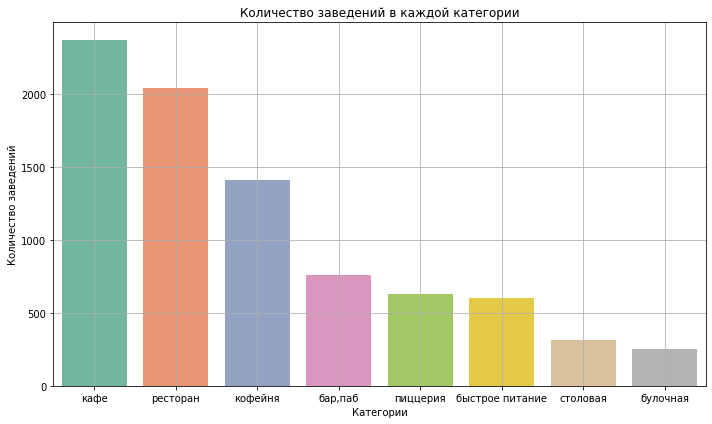

In [20]:
data_cat = data.groupby('category')['name'].count().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=data_cat.index, y=data_cat.values, palette='Set2')  # Горизонтальная диаграмма
plt.title('Количество заведений в каждой категории')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.grid()
plt.tight_layout()
plt.show()

Среди лидеров по количеству заведений:
- кафе - 2378 (28,3%), 
- рестораны - 2043 (24,3%),
- кофейни - 1413 (16,8%). 

Меньше всего в Москве булочных - 256 (3,05%) и столовых - 315 (3,75%).


### Исследуем количество посадочных мест в местах по категориям

In [21]:
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Будем ориентироваться на медианное значение,т.к. в наборе данных встречаются заведения на более чем 1200 человек, они могут сильно повлиять на результаты, а также есть заведения, где нет посадочных мест (скорее всего,эти заведения работают на вынос), эти данные тоже могут исказить результат, если брать среднее.

In [22]:
data_seats = data.groupby('category')['seats'].median()
data_seats = data_seats.sort_values(ascending = False)
data_seats

category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

Визуализируем полученные данные

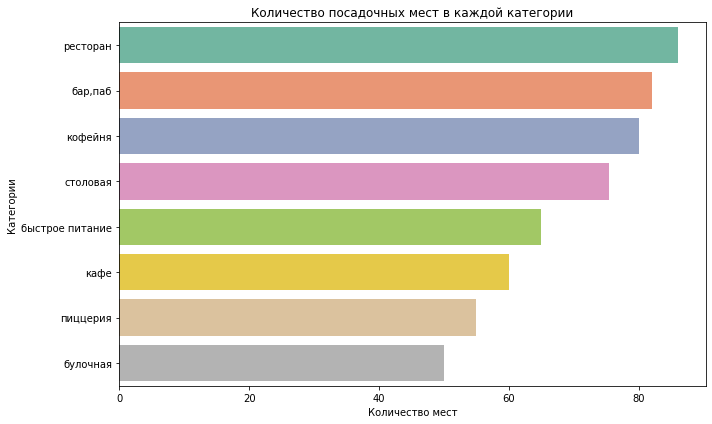

In [23]:
# Создание горизонтальной столбчатой диаграммы с seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=data_seats.values, y=data_seats.index, palette='Set2')  # Горизонтальная диаграмма
plt.title('Количество посадочных мест в каждой категории')
plt.xlabel('Количество мест')
plt.ylabel('Категории')
plt.tight_layout()
plt.show()

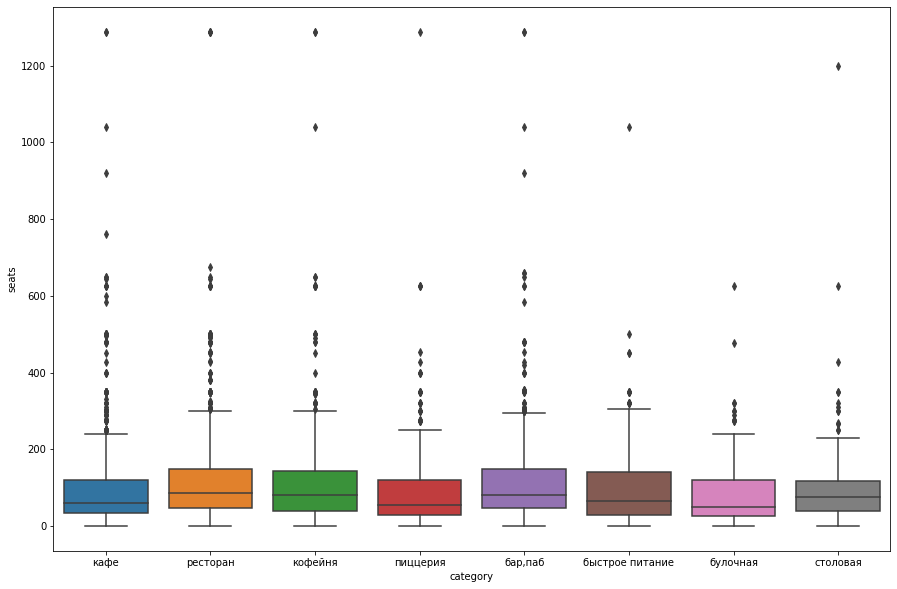

In [24]:
#диаграмма размаха
plt.figure(figsize=(15, 10))

fig = sns.boxplot(x='category', y='seats', data=data)
plt.show()


Среди лидеров по количеству посадочных мест рестораны, бары,пабы и кофейни (в этих заведениях часто собираются большой компанией).

Меньше всего посадочных мест в булочных и пиццериях (эти заведения часто работают на вынос).

Аномальные значения в количеством посадочных место больше 1000 встречаются во всех заведениях, кроме булочных.

### Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [25]:
data_chain = data.groupby('chain')['name'].count()

# Замена значений 0 на "несетевые", 1 на "сетевые" (для лучшего восприятия)
data_chain = data_chain.rename(index={0: 'Несетевые', 1: 'Сетевые'})
data_chain

chain
Несетевые    5199
Сетевые      3203
Name: name, dtype: int64

Визуализируем полученные данные

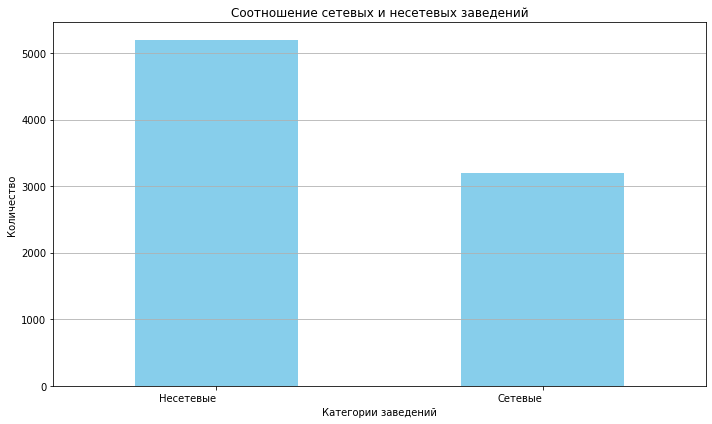

In [26]:
plt.figure(figsize=(10, 6))  # Размер графика
data_chain.plot(kind='bar', color='skyblue')  
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Количество')
plt.xticks(rotation=0, ha='right')  # Поворот подписей оси X
plt.tight_layout()  # Улучшенное размещение графика
plt.grid(axis='y')
plt.show()

In [27]:
# Построение круговой диаграммы
data_chain = data_chain.reset_index()

fig = px.pie(data_chain, 
             values='name',  # Значения для круговой диаграммы
             names='chain',  # Метки категорий
             title='Доля сетевых заведений')
# Добавляем подписи с долями (проценты)
fig.update_traces(textinfo='percent+label',  # Показывать проценты и названия категорий
                  textposition='inside',  # Подписи внутри диаграммы
                  hoverinfo='label+percent+value')  # Информация при наведении: метка, процент и значение

# Отображение диаграммы
fig.show()

Доля сетевых заведений в Москве составляет 38,1% (3205), несетевых - 61,9% (5201)

Посмотрим, какие категории заведений чаще являются сетевыми

In [28]:
# Группировка данных по категориям и типу заведений
data_chain_cat = data.groupby(['category','chain'])['name'].count().reset_index()

# Вычисление общего количества заведений в каждой категории
data_chain_cat['total_in_category'] = data_chain_cat.groupby('category')['name'].transform('sum')

# Вычисление процента для сетевых/несетевых заведений в каждой категории
data_chain_cat['percentage'] = (data_chain_cat['name'] / data_chain_cat['total_in_category']) * 100

#Удаление ненужных столбцов
data_chain_cat = data_chain_cat.drop(columns = ['total_in_category','name'])

# Просмотр результата
data_chain_cat = data_chain_cat.sort_values(by='category')
data_chain_cat

,category,chain,percentage
0,"бар,паб",False,78.010471
1,"бар,паб",True,21.989529
2,булочная,False,38.671875
3,булочная,True,61.328125
4,быстрое питание,False,61.525705
5,быстрое питание,True,38.474295
6,кафе,False,67.213805
7,кафе,True,32.786195
8,кофейня,False,49.044586
9,кофейня,True,50.955414


Визуализируем полученные данные

In [29]:
# Построение столбчатой диаграммы
fig = px.bar(data_chain_cat, 
             x='category', 
             y='percentage', 
             color='chain', 
             title='Процент сетевых и несетевых заведений в каждой категории',
             labels={'percentage': 'Процент', 'category': 'Категория', 'chain': 'Тип заведения'},
             barmode='stack')

# Отображение графика
fig.show()

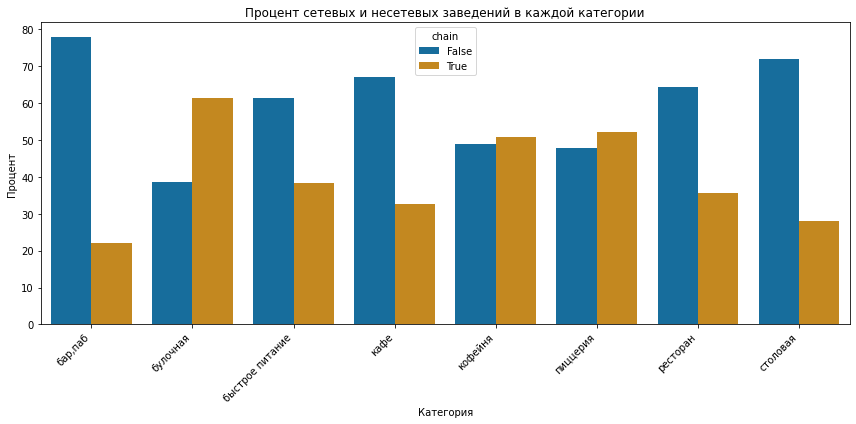

In [30]:
# Визуализация с помощью Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='category', y='percentage', hue='chain', data=data_chain_cat, palette= 'colorblind')
plt.title('Процент сетевых и несетевых заведений в каждой категории')
plt.xlabel('Категория')
plt.ylabel('Процент')
plt.xticks(rotation=45, ha='right')  # Поворот подписей категорий
plt.tight_layout()
plt.show()

Сетевых заведений больше всего среди булочных (61,3%), пиццерий (52,1%) и кофеен (50,95%). Их легче открыть , чем другие заведения, для получения высокой прибыли важен большой охват посетителей. Посетители здесь, как правило, долго не задерживаются, поэтому в таких заведениях важна быстрота обслуживания.

Среди несетевых заведений лидируют бары и пабы(77,9% заведений не являются сетевыми). Это понятно, ведь в таких заведениях важна особенная атмосфера и уникальность.

### Найдем топ-15 популярных сетей в Москве

In [31]:
top_15 = data[data['chain'] == 1].groupby('name')['name'].count().sort_values(ascending = False).head(15)
top_15

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
CofeFest                                32
Буханка                                 32
Му-Му                                   27
Name: name, dtype: int64

Визуализируем данные

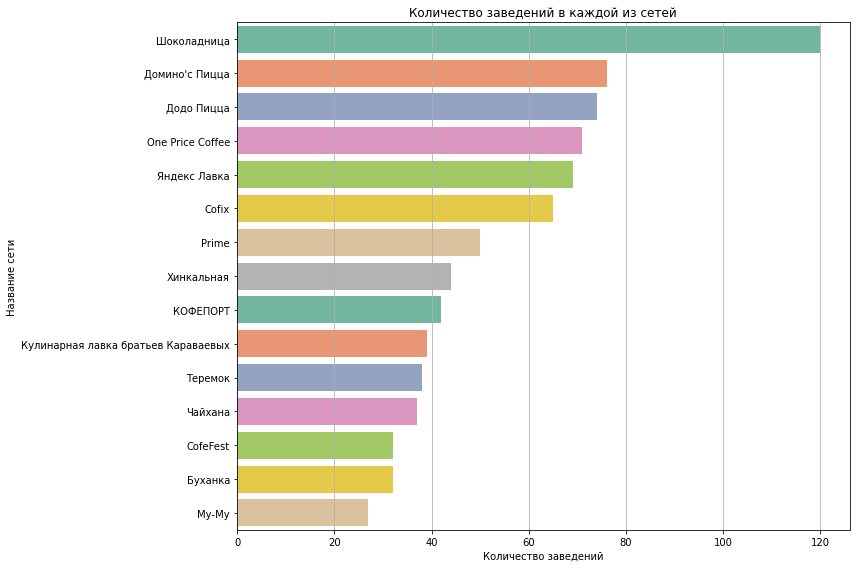

In [32]:
plt.figure(figsize=(12, 8))
sns.barplot(x=top_15.values, y=top_15.index, palette= 'Set2')
plt.title('Количество заведений в каждой из сетей')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.grid(axis = 'x')
plt.tight_layout()
plt.show()

Среди лидеров сетей по количеству заведений кофейня и две пиццерии:
- Шоколадница (120 заведений),
- Домино'с Пицца (76 заведений),
- Додо Пицца (74 заведения)



Посмотрим, какие категории заведений попали в Тор-15

In [33]:
top_15_names = top_15.index

# Фильтрация исходного DataFrame по этим заведениям
filtered_data = data[data['name'].isin(top_15_names)]

top_categories = filtered_data.groupby('category')['name'].count().sort_values(ascending = False)
top_categories

category
кофейня            336
ресторан           186
пиццерия           151
кафе               100
булочная            25
быстрое питание     12
бар,паб              4
столовая             2
Name: name, dtype: int64

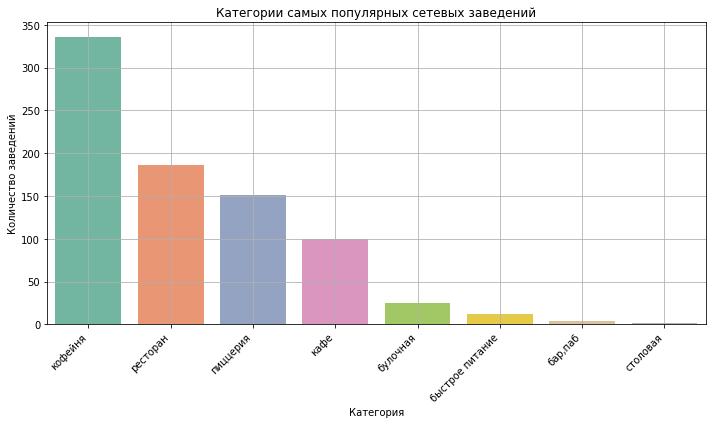

In [34]:
plt.figure(figsize=(10, 6))
sns.barplot(x=top_categories.index, y=top_categories.values, palette= 'Set2')
plt.title('Категории самых популярных сетевых заведений')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворот подписей оси X
plt.grid()
plt.tight_layout()
plt.show()

Большинство из Тор-15 - кофейни (лидер), рестораны и пиццерии.

Все эти заведения отличаются быстрым обслуживанием.

### Проанализируем общее количество заведений и количество заведений каждой категории по районам

In [35]:
data_district = data.groupby('district')['name'].count().sort_values(ascending = False)
data_district

district
Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: name, dtype: int64

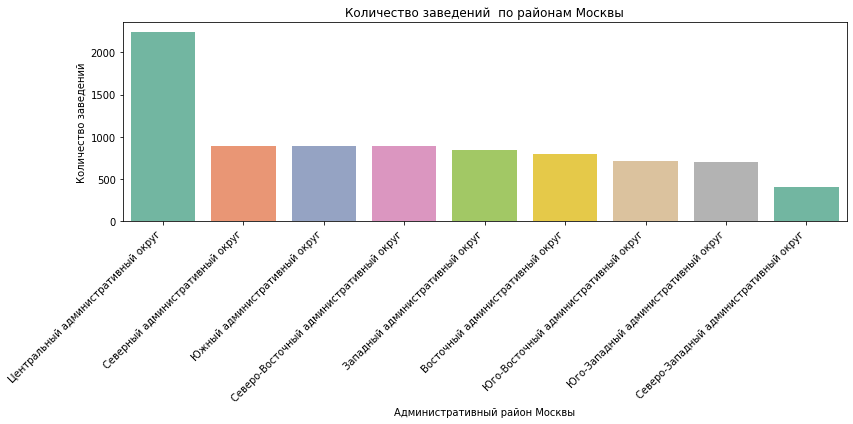

In [36]:
plt.figure(figsize=(12, 6))
sns.barplot(x=data_district.index, y=data_district.values, palette= 'Set2')
plt.title('Количество заведений  по районам Москвы')
plt.xlabel('Административный район Москвы')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворот подписей оси X
plt.tight_layout()
plt.show()

Лидер по количеству заведений - Центральный административный округ.

Посмотрим на количество разных категорий заведений по районам

In [37]:
data_district_cat = data.groupby(['district', 'category'])['name'].count().sort_values(ascending = False)
data_district_cat

district                                category
Центральный административный округ      ресторан    670
                                        кафе        464
                                        кофейня     428
                                        бар,паб     364
Юго-Восточный административный округ    кафе        282
                                                   ... 
Северо-Западный административный округ  бар,паб      23
                                        столовая     18
Юго-Западный административный округ     столовая     17
Юго-Восточный административный округ    булочная     13
Северо-Западный административный округ  булочная     12
Name: name, Length: 72, dtype: int64

Визуализируем полученные данные

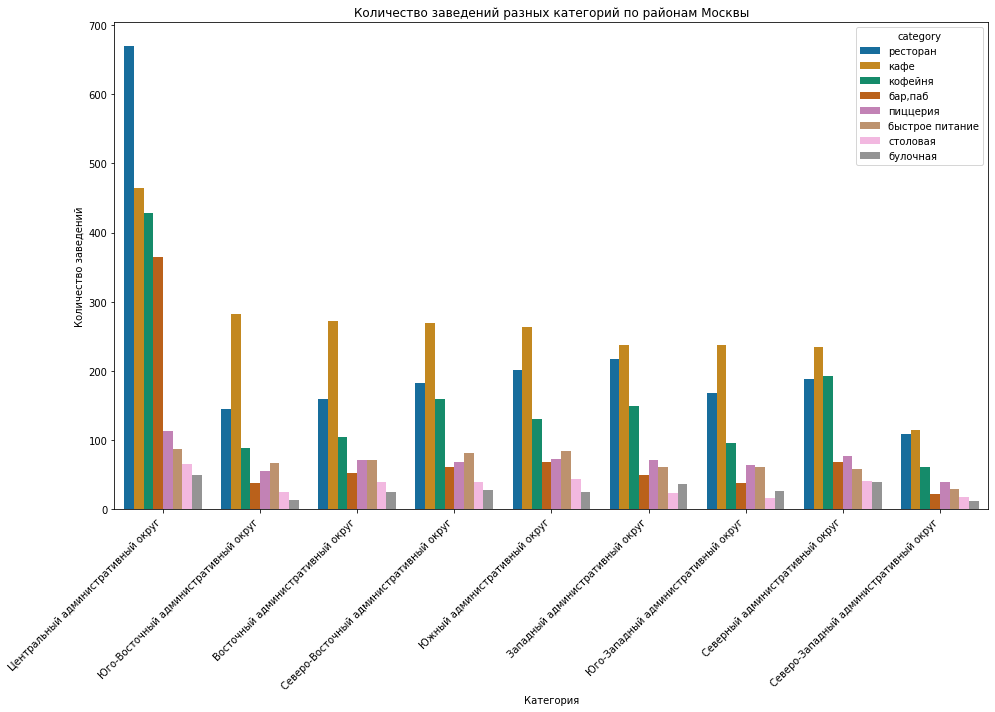

In [38]:
# Сброс индекса, чтобы преобразовать результат в обычный DataFrame
data_district_cat = data_district_cat.reset_index()

# Визуализация с помощью Seaborn
plt.figure(figsize=(14, 10))
sns.barplot(x='district', y='name', hue='category', data=data_district_cat, palette= 'colorblind')
plt.title('Количество заведений разных категорий по районам Москвы')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворот подписей категорий
plt.tight_layout()
plt.show()

In [39]:
# Группировка по районам и подсчет количества заведений на каждой улице
#data_district_cat = data.groupby('district')['name'].count().sort_values(ascending = False)


# Группировка по районам и категориям
data_district_cat = data.groupby(['district', 'category'])['name'].count().sort_values(ascending = False).reset_index()
# Добавляем столбец с общим количеством заведений на улице (для лучшего восприятия графика при визуализации)
data_district_cat['total_count'] = data_district_cat.groupby('district')['name'].transform('sum')

# Сортируем по общему количеству заведений
data_district_cat = data_district_cat.sort_values(by='total_count')

# Построение графика распределения
fig = px.bar(data_district_cat, 
             x='name', 
             y='district', 
             color='category', 
             title='Распределение количества заведений и их категорий по районам Москвы',
             labels={'name': 'Количество заведений', 'district': 'Район', 'category': 'Категория'},
             barmode='stack')

fig.show()


 Выводы:
 - Лидером по общему количеству заведений является **центральный округ**, в нем находится больше всего ресторанов, это логично, ведь центральный район считается премиальным, там не место дешевым столовым
 - Распределение заведений между оставшимися районами примерно одинаковое, выделяется разве что **северо-западный** административный округ, там находится меньше всего заведений и разница между соседними округами большая (почти вдвое).

### Пронализируем распределение средних рейтингов по категориям заведений

In [40]:
rating = data.groupby('category')['rating'].mean().round(2).sort_values(ascending = False).reset_index()
rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


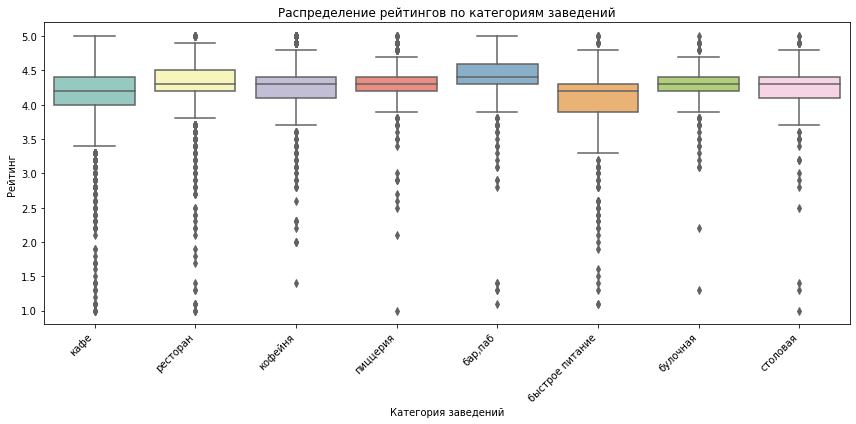

In [41]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='category', y='rating', data=data, palette='Set3')
plt.title('Распределение рейтингов по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Средний рейтинг по заведениям от 4,05 в заведениях быстрого питания до 4,39 в барах и пабах.

Значения среднего рейтинга по категориям заведений отличаются незначительно, но заметно, что посетители более критично относятся к кафе и быстрому питанию и более благосклонны к пабам и барам, пиццериям и ресторанам.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [42]:
data_rating = data.groupby('district', as_index=False)['rating'].mean().round(2)
data_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [43]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(map_1)

# выводим карту
map_1

Самый высокий рейтинг заведений у центрального района.

Самый низкий рейтинг заведений у юго-восточного района.

### Отобразим все заведения датасета на карте с помощью кластеров

In [44]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(map_1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
map_1

### Проанализируем топ-15 улиц по количеству заведений

In [45]:
data_streets = data.groupby('street')['name'].count().sort_values(ascending= False)
data_streets.head(15)

street
проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

In [46]:
# Группировка по улицам и подсчет количества заведений на каждой улице
data_streets = data.groupby('street')['name'].count().sort_values(ascending=False).head(15)

# Выбор данных только для топ-15 улиц
top_streets_data = data[data['street'].isin(data_streets.index)]

# Группировка по улицам и категориям
grouped_data = top_streets_data.groupby(['street', 'category'])['name'].count().sort_values(ascending=False).reset_index()

# Добавляем столбец с общим количеством заведений на улице (для лучшего восприятия графика при визуализации)
grouped_data['total_count'] = grouped_data.groupby('street')['name'].transform('sum')

# Сортируем по общему количеству заведений
grouped_data = grouped_data.sort_values(by='total_count', ascending=False)

# Построение графика распределения
fig = px.bar(grouped_data, 
             x='street', 
             y='name', 
             color='category', 
             title='Распределение количества заведений и их категорий по топ-15 улицам',
             labels={'name': 'Количество заведений', 'street': 'Улица', 'category': 'Категория'},
             barmode='stack')

fig.show()


Выводы:
- Больше всего заведений находится на проспекте Мира (играет роль протяженность улицы), из всех категорий там преобладают кафе
- Также в ТОП-3 вошли Профсоюзная улица и проспект Вернадского. На Профсоюзной преобладают также кафе, а вот на Вернадского чаще встречаются рестораны.

### Рассмотрим улицы, на которых находится только один объект общепита

In [47]:
# Группировка данных по улицам и подсчет количества объектов на каждой улице
street_counts = data.groupby('street')['name'].count()

# Фильтрация улиц, где количество объектов общепита равно 1
streets_with_one_object = street_counts[street_counts == 1].index

# Выбор данных для этих улиц
one_object_data = data[data['street'].isin(streets_with_one_object)]

# Просмотр результата
one_object_data.head()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,False,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,False,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,True,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,True,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,True,NaN,ландшафтный заказник Лианозовский,False


In [48]:
one_object_data.groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             53
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: name, dtype: int64

In [49]:
one_object_data1 = one_object_data.groupby('category')['name'].count().sort_values(ascending = False).reset_index()

In [50]:
# Построение круговой диаграммы
fig = px.pie(one_object_data1, 
             values='name',  # Значения для круговой диаграммы
             names='category',  # Метки категорий
             title='Распределение заведений по категориям на улицах с 1 заведением')
# Добавляем подписи с долями (проценты)
fig.update_traces(textinfo='percent+label',  # Показывать проценты и названия категорий
                  textposition='inside',  # Подписи внутри диаграммы
                  hoverinfo='label+percent+value')  # Информация при наведении: метка, процент и значение


fig.show()

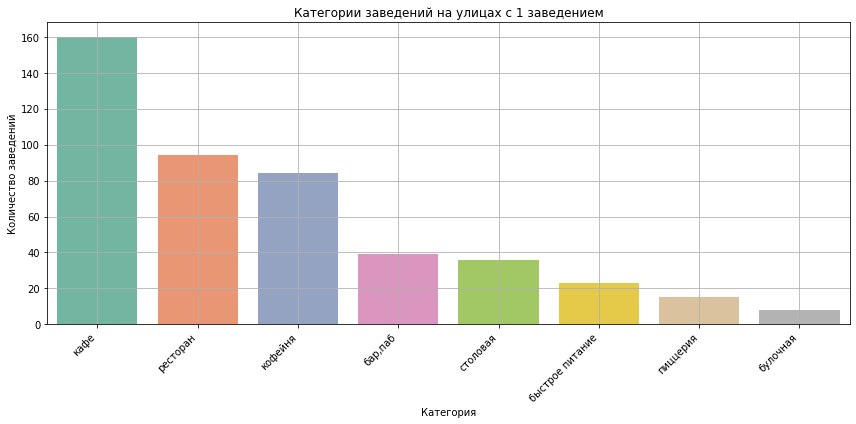

In [51]:
one_object_data2 = one_object_data.groupby('category')['name'].count().sort_values(ascending = False)

plt.figure(figsize=(12, 6))
sns.barplot(x=one_object_data2.index, y=one_object_data2.values, palette= 'Set2')
plt.title('Категории заведений на улицах с 1 заведением')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворот подписей оси X
plt.grid()
plt.tight_layout()
plt.show()

Выводы:
- На улицах, где есть только 1 заведение, чаще всего встречаются кафе (34,9%), чуть менее популярны рестораны (20,3%) и кофейни (18,3%)
- Одинокие булочные на таких улицах непопулярны и встречаются лишь в 1,75% случаев.
- Чаще всего улицы с одним заведением встречаются в центральном районе.

### Проанализируем средний чек по заведениям в районах Москвы и построим фоновую картограмму (хороплет) с полученными значениями для каждого района

In [52]:
middle_avg_bill = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending = False)
middle_avg_bill

district
Западный административный округ            1000.0
Центральный административный округ         1000.0
Северо-Западный административный округ      700.0
Северный административный округ             650.0
Юго-Западный административный округ         600.0
Восточный административный округ            575.0
Северо-Восточный административный округ     500.0
Южный административный округ                500.0
Юго-Восточный административный округ        450.0
Name: middle_avg_bill, dtype: float64

In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(map_2)

# выводим карту
map_2

Посмотрим распределение среднего чека по районам Москвы

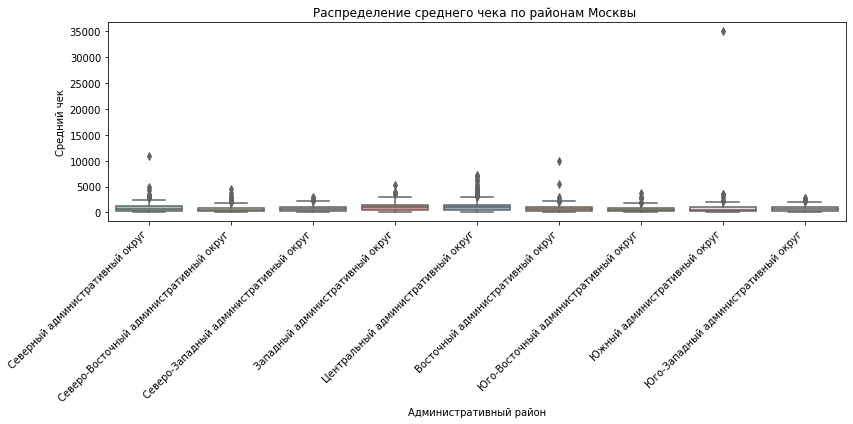

In [54]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='district', y='middle_avg_bill', data=data, palette='Set3')
plt.title('Распределение среднего чека по районам Москвы ')
plt.xlabel('Административный район')
plt.ylabel('Средний чек')



plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

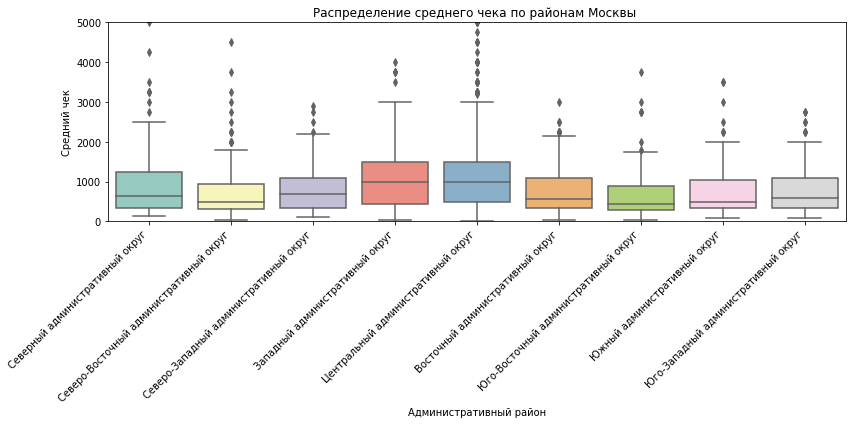

In [55]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='district', y='middle_avg_bill', data=data, palette='Set3')
plt.title('Распределение среднего чека по районам Москвы ')
plt.xlabel('Административный район')
plt.ylabel('Средний чек')

# Ограничения по оси Y (для лучшей читаемости графика)
plt.ylim(0, 5000) 

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Центральный и западный округ имеют самый высокий средний чек (по медиане)- 1000 рублей.
Наименьший средний чек (по медиане) имеют южный, юго-восточный и северо-восточный округа (450-500 рублей).

***Выводы:***
- По количеству заведений в Москве лидируют категории:
   - кафе - 2378 (28,3%),
   - рестораны - 2043 (24,3%),
   - кофейни - 1413 (16,8%).
- Меньше всего в Москве булочных - 256 (3,05%) и столовых - 315 (3,75%).


- Среди лидеров по количеству посадочных мест рестораны, бары,пабы и кофейни (в этих заведениях часто собираются большой компанией).
- Меньше всего посадочных мест в булочных и пиццериях (эти заведения часто работают на вынос).


- Доля сетевых заведений в Москве составляет 38,1% (3205), несетевых - 61,9% (5201).
- **Сетевых заведений** больше всего среди булочных (61,3%), пиццерий (52,1%) и кофеен (50,95%) (легче открыть ,для получения высокой прибыли важен большой охват посетителей). Посетители здесь, как правило, долго не задерживаются, поэтому в таких заведениях важна быстрота обслуживания.
- Среди **несетевых заведений** лидируют бары и пабы(77,9% заведений не являются сетевыми). В таких заведениях важна особенная атмосфера и уникальность.
- Среди **лидеров сетей** по количеству заведений кофейня и две пиццерии: Шоколадница (120 заведений),Домино'с Пицца (76 заведений),Додо Пицца (74 заведения).
- Большинство из Тор-15 сетевых заведений - кофейни (лидер), рестораны и пиццерии.Все эти заведения отличаются быстрым обслуживанием.


- Лидером по общему **количеству заведений** является **центральный округ**, в нем находится больше всего ресторанов, это логично, ведь центральный район считается премиальным. Распределение заведений между оставшимися районами примерно одинаковое, выделяется разве что северо-западный административный округ, там находится меньше всего заведений и разница между соседними округами большая (почти вдвое).
- Больше всего заведений находится на **проспекте Мира**, из всех категорий там преобладают кафе.Также в ТОП-3 вошли Профсоюзная улица и проспект Вернадского. На Профсоюзной преобладают также кафе, а вот на Вернадского чаще встречаются рестораны.
- На улицах, где есть **только 1 заведение**, чаще всего встречаются кафе (34,9%), чуть менее популярны рестораны (20,3%) и кофейни (18,3%). Одинокие булочные на таких улицах непопулярны и встречаются лишь в 1,75% случаев. Чаще всего улицы с одним заведением встречаются в центральном районе.


- **Средний рейтинг** по заведениям от 4,05 в заведениях быстрого питания до 4,39 в барах и пабах.Значения среднего рейтинга по категориям заведений отличаются незначительно, но заметно, что посетители более критично относятся к кафе и быстрому питанию и более благосклонны к пабам и барам, пиццериям и ресторанам.
- Самый высокий рейтинг заведений у центрального района.Самый низкий рейтинг заведений у юго-восточного района.


- Центральный и западный округ имеют самый высокий **средний чек** (по медиане)- 1000 рублей. Наименьший средний чек (по медиане) имеют южный, юго-восточный и северо-восточный округа (450-500 рублей).


## Открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

In [56]:
coffee = data[data['category'] == 'кофейня']
print(f"Общее количество кофеен в Москве: {len(coffee)}")

Общее количество кофеен в Москве: 1413


<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Расчёт корректый

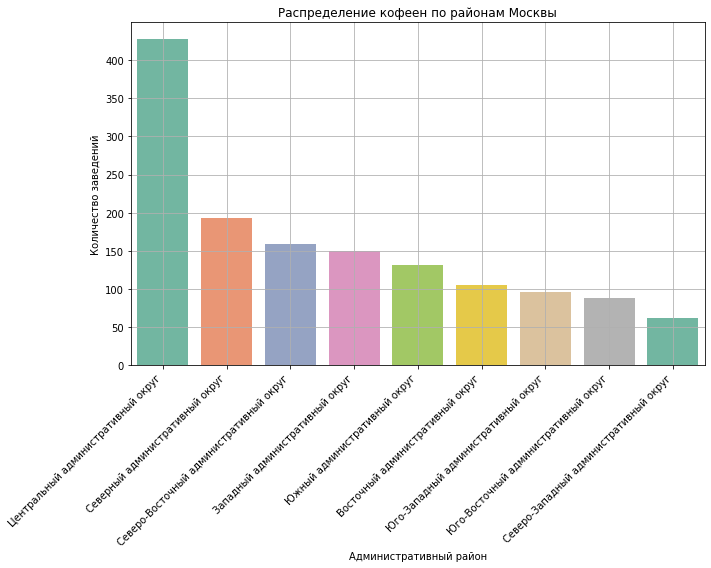

In [57]:
coffee_district = coffee.groupby('district')['name'].count().sort_values(ascending = False)

plt.figure(figsize=(10, 8))
sns.barplot(x=coffee_district.index, y=coffee_district.values, palette= 'Set2')
plt.title('Распределение кофеен по районам Москвы')
plt.xlabel('Административный район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, ha='right')  # Поворот подписей оси X
plt.grid()
plt.tight_layout()
plt.show()

In [58]:
coffee_district = coffee_district.reset_index()

Больше всего кофеен в Центральном районе (30,3%)

Меньше всего кофеен в Северо-Западном районе (4,39%)

In [60]:
#количество круглосуточных кофеен

print(f"Общее количество круглосуточных кофеен в Москве: {len(coffee[coffee['is_24_7']==True])}")


Общее количество круглосуточных кофеен в Москве: 59


In [61]:
coffee_24_7 = round((len(coffee[coffee['is_24_7']==True])/len(coffee))*100, 2)
print(f"Процент круглосуточных кофеен в Москве: {coffee_24_7}%")

Процент круглосуточных кофеен в Москве: 4.18%


In [62]:
coffee_rating = coffee.groupby('district')['rating'].mean().sort_values(ascending = False).reset_index()
coffee_rating.round(2)

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


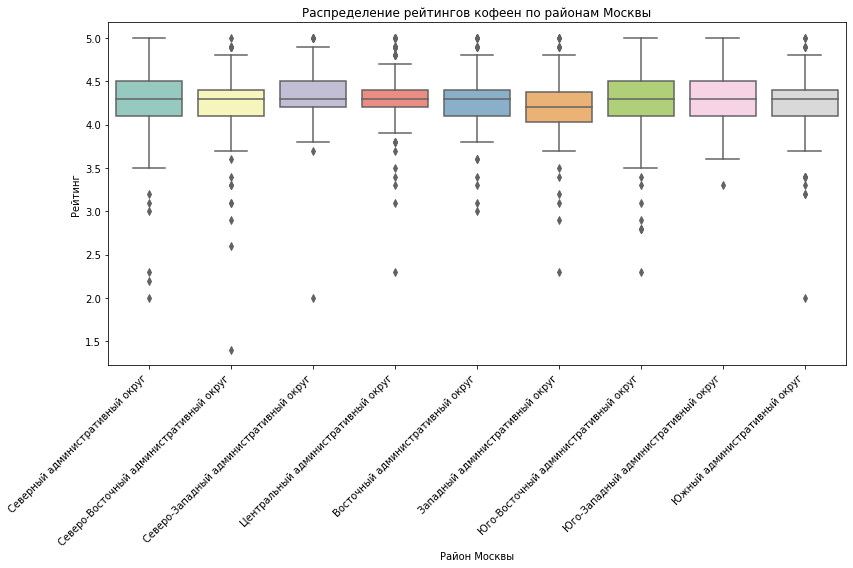

In [63]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='district', y='rating', data= coffee, palette='Set3')
plt.title('Распределение рейтингов кофеен по районам Москвы')
plt.xlabel('Район Москвы')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Средний рейтинг среди всех кофеен почти одинаков и колеблется от 4.2 (Западный район) до 4.34 (Центральный район)

In [64]:
coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Средняя стоимость чашки кофе по Москве от 60 до 1568 рублей. Аномальные значения могут влиять на результат анализа,поэтому в расчете будем использовать медианное значение, а не среднее.

In [65]:
middle_coffee_cup = coffee.groupby('district')['middle_coffee_cup'].median().sort_values(ascending = False).reset_index()
middle_coffee_cup

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Самая доступная по цене чашка кофе в Восточном административном округе (135 рублей), самая дорогая - в Юго-Западном (198 рублей), Центральном (190 рублей) и Западном (189 рублей).

Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [66]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
map_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки кофе по районам Москвы',
).add_to(map_3)

# выводим карту
map_3

***Выводы:***
- Целесообразно открытие новой кофейни в ***Северо-Западном административном округе***:
   - здесь расположено всего 4,39% от общего числа кофеен по Москве  (потенциальная возможность привлечения большего количества клиентов)
   - относительно высокий рейтинг имеющихся кофеен говорит о том, что посетители любят вкусный кофе и готовы прийти за ним к вам
   - медианная стоимость чашки кофе здесь не самая высокая, что также привлечет клиентов
- Стоит рассмотреть круглосуточный формат заведения (всего 4,18% кофеен в Москве работают 24/7, можно попробовать заполнить эту нишу)
- Для определения места открытия кофейни следует проанализировать расположенные в районе высшие учебные заведения, офисные помещения, торговые и развлекательные центры как источники потенциальных посетителей. 

Презентация:https://drive.google.com/file/d/1SiIA5E5dia191Qs3eeGTNay01Or7nnnK/view?usp=drive_link